In [1]:
import os
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from fastprogress import master_bar, progress_bar
import plotly.graph_objects as go
import plotly.io as pio

# Get access to all the files in the repository
cwd = os.getcwd()
parentDir = os.path.dirname( cwd )
sys.path.append(parentDir)

Define a function that calculates the distances of points to the surface of their respective cylinder. Then define a function that creates plots from the distribution

In [2]:
def distance_to_surface( cloud, cylinders, absolute=True ):
    """
        Returns a np.array that for each point includes the distance to surface and the radius of the cylinder in centimeters
    """
    distances = np.zeros( (len(cloud),2) )
    ids = cloud[:,6]

    offsets = cloud[:,3:6]

    # Ensure cylinders are indexed by their IDs for quick lookup
    cylinder_dict = {row['ID']: row['radius'] for _, row in cylinders.iterrows()}

    for i, point_id in enumerate(ids):
        # Compute the magnitude of the offset vector
        offset_magnitude = np.linalg.norm(offsets[i])
        
        # Get the radius of the corresponding cylinder
        cylinder_radius = cylinder_dict.get(point_id, 0)  # Default to 0 if ID is not found
        
        # Compute the distance to the surface
        if absolute:
            distance_to_surface = abs(offset_magnitude - cylinder_radius)
        else:
            distance_to_surface = offset_magnitude - cylinder_radius
        
        # Store the distance and radius in the result array
        distances[i, 0] = distance_to_surface * 100
        distances[i, 1] = cylinder_radius * 100

    return distances


def distance_boxplot_and_histograms(cloud_dir, cylinder_dir, radius_bins=None, plot_save_path=None):
    """
    Calculate distances to the surface for all clouds and cylinders in the given directories,
    create boxplots for specified radius bins, and plot histograms of distances for each bin.

    Parameters:
        cloud_dir (str): Directory containing point cloud files (NumPy `.npy` files).
        cylinder_dir (str): Directory containing cylinder files (Pandas `.csv` files).
        radius_bins (list): List of bin edges for grouping radii (default: [0, 1, 2, 4, 8, 16, 32]).
        plot_save_path (str): Path to save the resulting plot (optional).
    
    Returns:
        None
    """
    if radius_bins is None:
        radius_bins = [0, 1, 2, 4, 8, 16, 32]

    all_distances = []  # Store all distances for boxplot
    all_radii = []      # Store all radii for binning

    print("Processing clouds and QSM models...")
    # Iterate over all cloud and cylinder files
    for cloud_file in os.listdir(cloud_dir):
        if cloud_file.endswith(".npy"):
            cloud_path = os.path.join(cloud_dir, cloud_file)
            cylinder_path = os.path.join(cylinder_dir, cloud_file.replace("labeled.npy", "000000.csv"))

            # Load the cloud and corresponding cylinder data
            cloud = np.load(cloud_path)
            cylinders = pd.read_csv(cylinder_path)
            cylinders.columns = cylinders.columns.str.strip()  # Clean whitespaces

            # Compute distances for this pair
            distances = distance_to_surface(cloud, cylinders)
            all_distances.extend(distances[:, 0])
            all_radii.extend(distances[:, 1])

    print("Finished, starting plotting process...")

    # Convert data to a DataFrame for easier handling
    data = pd.DataFrame({'distance': all_distances, 'radius': all_radii})
    
    # Assign each point to a radius bin
    data['radius_bin'] = pd.cut(data['radius'], bins=radius_bins, labels=radius_bins[:-1])

    # Create the boxplot
    plt.figure(figsize=(10, 6))
    boxplot_data = [data[data['radius_bin'] == bin]['distance'] for bin in radius_bins[:-1]]
    plt.boxplot(boxplot_data, labels=[f"{radius_bins[i]}-{radius_bins[i + 1]}" for i in range(len(radius_bins) - 1)])

    # Add plot details
    plt.xlabel("Radius Bins [cm]")
    plt.ylabel("Distance to Surface [cm]")
    plt.title("Distribution of Distances to Cylinder Surfaces by Radius Bins [cm]")
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Save or show the boxplot
    if plot_save_path:
        plt.savefig(plot_save_path + "_boxplot.png", dpi=300)
    plt.show()

    # Filter distances greater than 50 cm for the histograms
    data = data[data['distance'] <= 50]

    # Create histograms
    bins = np.arange(0, 52, 2)  # Shared bins from 0 to 50 cm with 2 cm steps
    fig, axes = plt.subplots(3, 2, figsize=(12, 12), sharex=True)
    axes = axes.flatten()

    fig.suptitle('Distribution of Distances to Cylinder Surfaces')

    for i, bin in enumerate(radius_bins[:-1]):
        if i >= len(axes):  # Ensure only valid subplots are addressed
            break
        bin_data = data[data['radius_bin'] == bin]['distance']
        ax = axes[i]
        ax.hist(bin_data, bins=bins, alpha=1.0, edgecolor='black', density=True)
        ax.set_title(f"Cylinder Radius from {radius_bins[i]} to {radius_bins[i + 1]} cm")
        if i==4 or i==5:
            ax.set_xlabel("Distance to Surface [cm]")
        if i==0 or i==2 or i==4:
            ax.set_ylabel("PDF")
        ax.grid(alpha=0.5)

    # Adjust layout and save or show the histograms
    plt.tight_layout()
    if plot_save_path:
        plt.savefig(plot_save_path + "_histograms.png", dpi=300)
    plt.show()


def plot_cloud_3d_with_distances(cloud, cylinders, cutoff=10, pointSize=2, pointOpac=1.0, slice=False, dimension="x", sliceMin=-0.1, sliceMax=0.1, plotSavePath=None):
    """
    Plot a 3D point cloud, marking points with a distance >10cm in red and thicker,
    while others are black, small, and transparent.

    Parameters:
        cloud (np.ndarray): The point cloud data.
        cylinders (pd.DataFrame): The cylinder data for distance calculation.
        dimension (str): Axis to slice along ("x", "y", or "z").
        sliceMin (float): Minimum value for slicing.
        sliceMax (float): Maximum value for slicing.
    """
    # Center x and y
    x = cloud[:, 0] - cloud[:, 0].mean()
    y = cloud[:, 1] - cloud[:, 1].mean()
    z = cloud[:, 2]

    # Compute distances to cylinder surfaces
    distances = distance_to_surface(cloud, cylinders)
    distances_to_surface = distances[:, 0]

    # Separate points based on distances
    high_dist_indices = distances_to_surface > cutoff
    low_dist_indices = ~high_dist_indices

    # Filter a slice based on the specified dimension
    if dimension == "x":
        slice_indices = (x > sliceMin) & (x < sliceMax)
    elif dimension == "y":
        slice_indices = (y > sliceMin) & (y < sliceMax)
    elif dimension == "z":
        slice_indices = (z > sliceMin) & (z < sliceMax)

    x_slice = x[slice_indices]
    y_slice = y[slice_indices]
    z_slice = z[slice_indices]

    # Create a 3D scatter plot
    fig = go.Figure()

    # Plot low-distance points
    fig.add_trace(go.Scatter3d(
        x=x[low_dist_indices], y=y[low_dist_indices], z=z[low_dist_indices],
        mode='markers',
        marker=dict(
            size=pointSize,
            color='black',
            opacity=pointOpac
        ),
        name='Low Distance Points'
    ))

    # Plot high-distance points
    fig.add_trace(go.Scatter3d(
        x=x[high_dist_indices], y=y[high_dist_indices], z=z[high_dist_indices],
        mode='markers',
        marker=dict(
            size=pointSize,
            color='red',
            opacity=pointOpac
        ),
        name='High Distance Points'
    ))

    # Plot the slice
    if slice:
        fig.add_trace(go.Scatter3d(
            x=x_slice, y=y_slice, z=z_slice,
            mode='markers',
            marker=dict(size=4, color='blue'),
            name='Slice'
        ))

    # Customize layout
    fig.update_layout(
        scene=dict(
            xaxis=dict(showgrid=True, gridcolor='lightgrey', gridwidth=1),
            yaxis=dict(showgrid=True, gridcolor='lightgrey', gridwidth=1),
            zaxis=dict(showgrid=True, gridcolor='lightgrey', gridwidth=1),
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        title='Interactive Point Cloud with Highlighted Distances'
    )

    # Set axis limits
    fig.update_layout(
        scene=dict(
            xaxis=dict(range=[x.min(), x.max()], title="X Axis"),
            yaxis=dict(range=[y.min(), y.max()], title="Y Axis"),
            zaxis=dict(range=[z.min(), z.max()], title="Z Axis")
        )
    )

    if plotSavePath:
        pio.write_html(fig, plotSavePath)

    # Show the plot
    fig.show()

def plot_cloud_3d_with_distances_cylinders(cloud, cylinders, cutoff=10, pointSize=2, pointOpac=1.0, slice=False, dimension="x", sliceMin=-0.1, sliceMax=0.1, plotSavePath=None):
    """
    Plot a 3D point cloud, marking points with a distance >10cm in red and thicker,
    while others are black, small, and transparent.

    Parameters:
        cloud (np.ndarray): The point cloud data.
        cylinders (pd.DataFrame): The cylinder data for distance calculation.
        dimension (str): Axis to slice along ("x", "y", or "z").
        sliceMin (float): Minimum value for slicing.
        sliceMax (float): Maximum value for slicing.
    """
    # Center x and y
    x = cloud[:, 0] - cloud[:, 0].mean()
    y = cloud[:, 1] - cloud[:, 1].mean()
    z = cloud[:, 2]

    # Compute distances to cylinder surfaces
    distances = distance_to_surface(cloud, cylinders)
    distances_to_surface = distances[:, 0]

    # Separate points based on distances
    high_dist_indices = distances_to_surface > cutoff
    low_dist_indices = ~high_dist_indices

    # Filter a slice based on the specified dimension
    if dimension == "x":
        slice_indices = (x > sliceMin) & (x < sliceMax)
    elif dimension == "y":
        slice_indices = (y > sliceMin) & (y < sliceMax)
    elif dimension == "z":
        slice_indices = (z > sliceMin) & (z < sliceMax)

    x_slice = x[slice_indices]
    y_slice = y[slice_indices]
    z_slice = z[slice_indices]

    # Create a 3D scatter plot
    fig = go.Figure()

    # Plot low-distance points
    fig.add_trace(go.Scatter3d(
        x=x[low_dist_indices], y=y[low_dist_indices], z=z[low_dist_indices],
        mode='markers',
        marker=dict(
            size=pointSize,
            color='black',
            opacity=pointOpac
        ),
        name='Low Distance Points'
    ))

    # Plot high-distance points
    fig.add_trace(go.Scatter3d(
        x=x[high_dist_indices], y=y[high_dist_indices], z=z[high_dist_indices],
        mode='markers',
        marker=dict(
            size=pointSize,
            color='red',
            opacity=pointOpac
        ),
        name='High Distance Points'
    ))

    # Plot the slice
    if slice:
        fig.add_trace(go.Scatter3d(
            x=x_slice, y=y_slice, z=z_slice,
            mode='markers',
            marker=dict(size=4, color='blue'),
            name='Slice'
        ))

    # Add cylinders
    for _, cylinder in cylinders.iterrows():
        cx, cy, cz = cylinder['startX'], cylinder['startY'], cylinder['startY']
        dx, dy, dz = cylinder['endX'], cylinder['endY'], cylinder['endZ']
        radius = cylinder['radius']

        # Create cylinder surface points
        theta = np.linspace(0, 2 * np.pi, 30)
        z_heights = np.linspace(0, np.linalg.norm([cx-dx, cy-dy, cz-dz]), 30)
        theta, z_heights = np.meshgrid(theta, z_heights)

        x_cyl = cx + radius * np.cos(theta)
        y_cyl = cy + radius * np.sin(theta)
        z_cyl = cz + z_heights

        # Add cylinder as a mesh
        fig.add_trace(go.Surface(
            x=x_cyl, y=y_cyl, z=z_cyl,
            opacity=0.5,
            colorscale="Blues",
            showscale=False,
            name="Cylinder"
        ))

    # Customize layout
    fig.update_layout(
        scene=dict(
            xaxis=dict(showgrid=True, gridcolor='lightgrey', gridwidth=1),
            yaxis=dict(showgrid=True, gridcolor='lightgrey', gridwidth=1),
            zaxis=dict(showgrid=True, gridcolor='lightgrey', gridwidth=1),
            xaxis_title='X Axis',
            yaxis_title='Y Axis',
            zaxis_title='Z Axis'
        ),
        title='Interactive Point Cloud with Highlighted Distances'
    )

    # Set axis limits
    fig.update_layout(
        scene=dict(
            xaxis=dict(range=[x.min(), x.max()], title="X Axis"),
            yaxis=dict(range=[y.min(), y.max()], title="Y Axis"),
            zaxis=dict(range=[z.min(), z.max()], title="Z Axis")
        )
    )

    if plotSavePath:
        pio.write_html(fig, plotSavePath)

    # Show the plot
    fig.show()

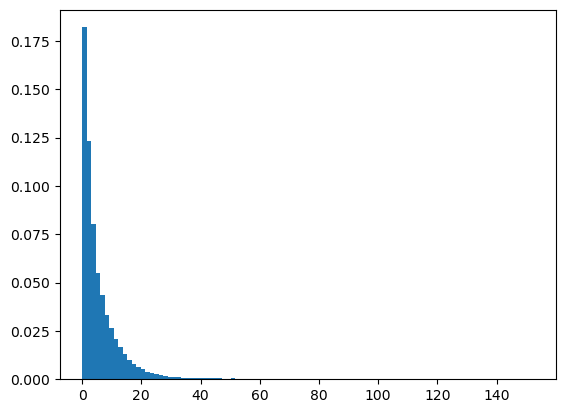

In [14]:
cloudName = "33_4"
cloud = np.load( os.path.join(parentDir, 'data', 'labeled', 'cloud', f'{cloudName}_labeled.npy') )

cylinders = pd.read_csv( os.path.join(parentDir, 'data', 'raw', 'QSM', 'detailed', f'{cloudName}_000000.csv'), header=0)
cylinders.columns = cylinders.columns.str.strip() # Clean whitespaces
cylinders.head()

distances = distance_to_surface(cloud, cylinders, absolute=True)

plt.figure()

plt.hist(distances[:,0], bins=100, density=True)

plt.show()

Processing clouds and QSM models...
Finished, starting plotting process...


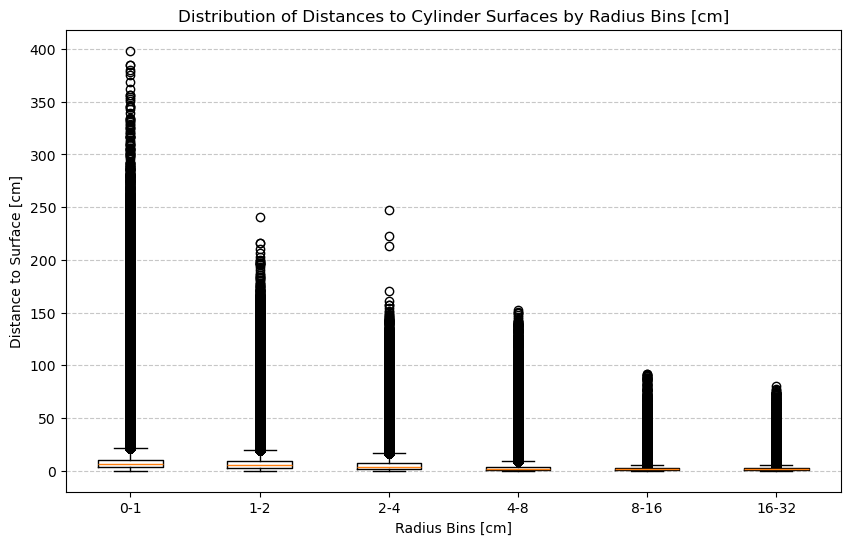

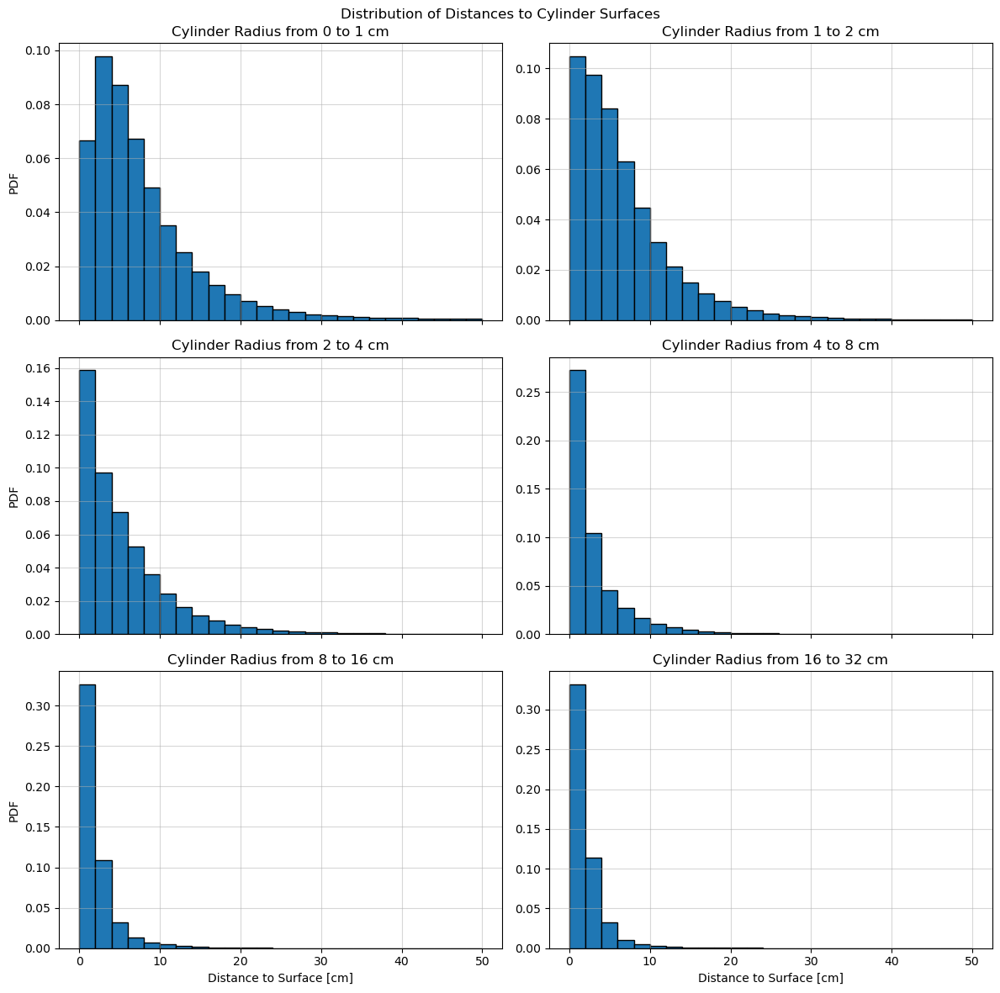

In [43]:
cloudDir = os.path.join( parentDir, 'data', 'labeled', 'cloud' )
cylinderDir = os.path.join( parentDir, 'data', 'raw', 'QSM', 'detailed' )

radius_bins = [0, 1, 2, 4, 8, 16, 32]

plotSavePath = os.path.join( parentDir, 'plots', 'DataAnalysis', 'Distance_analysis' )

distance_boxplot_and_histograms( cloudDir, cylinderDir, radius_bins, plot_save_path=plotSavePath )

In [ ]:
cloudName = "63_17"
cloud = np.load( os.path.join(parentDir, 'data', 'labeled', 'cloud', f'{cloudName}_labeled.npy') )

cylinders = pd.read_csv( os.path.join(parentDir, 'data', 'raw', 'QSM', 'detailed', f'{cloudName}_000000.csv'), header=0)
cylinders.columns = cylinders.columns.str.strip() # Clean whitespaces

cutoff =10

plotSavePath = os.path.join( parentDir, 'plots', 'DataAnalysis', f'interactive_{cloudName}_CO{cutoff}cm.html' )

plot_cloud_3d_with_distances(cloud, cylinders, cutoff=cutoff, slice=False, plotSavePath=plotSavePath)

In [ ]:
cloudName = "63_17"
cloud = np.load( os.path.join(parentDir, 'data', 'labeled', 'cloud', f'{cloudName}_labeled.npy') )

cylinders = pd.read_csv( os.path.join(parentDir, 'data', 'raw', 'QSM', 'detailed', f'{cloudName}_000000.csv'), header=0)
cylinders.columns = cylinders.columns.str.strip() # Clean whitespaces

cutoff =10

# plotSavePath = os.path.join( parentDir, 'plots', 'DataAnalysis', f'interactive_{cloudName}_CO{cutoff}cm.html' )
plotSavePath = None

plot_cloud_3d_with_distances_cylinders(cloud, cylinders, cutoff=cutoff, slice=False, plotSavePath=plotSavePath)